# Import Library

In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report

In [2]:
# Cek GPU
device = '/GPU:0' if tf.config.list_physical_devices('GPU') else '/CPU:0'
print(f"Using device: {device}")

Using device: /GPU:0


# Download Dataset

In [3]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"naubass","key":"971f5810f2bafc6d58b33c053aefdf0e"}'}

In [4]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d rizkyyk/dataset-food-classification

Dataset URL: https://www.kaggle.com/datasets/rizkyyk/dataset-food-classification
License(s): MIT
100% 1.09G/1.09G [00:14<00:00, 82.8MB/s]



In [6]:
!unzip dataset-food-classification.zip -d /content/

Output streaming akan dipotong hingga 5000 baris terakhir.
  inflating: /content/dataset_gambar/train/French Fries/French Fries_068.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_069.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_070.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_071.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_072.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_075.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_076.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_077.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_078.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_080.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_081.jpg  
  inflating: /content/dataset_gambar/train/French Fries/French Fries_083

# Image Preprocessing & Augmentation

In [7]:
train_dir = "dataset_gambar/train/"
val_dir = "dataset_gambar/valid/"
test_dir = "dataset_gambar/test/"

In [8]:
source_images = "dataset_gambar/"
train_images = "dataset_gambar/train/"
val_images = "dataset_gambar/valid/"
test_images = "dataset_gambar/test/"

In [9]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    horizontal_flip = True,
    rotation_range = 0.2 ,
    zoom_range = 0.2,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    horizontal_flip = True,
    rotation_range = 0.2 ,
    zoom_range = 0.2,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
)

In [10]:
train_batch_size = 20
val_batch_size = 10

train_images = train_generator.flow_from_directory(
    directory=train_dir,
    target_size=(224, 224),
    batch_size=train_batch_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    seed=42
)

val_images = train_generator.flow_from_directory(
    directory=val_dir,
    target_size=(224, 224),
    batch_size=val_batch_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    seed=42
)

test_images = test_generator.flow_from_directory(
    directory=test_dir,
    target_size=(224, 224),
    batch_size=20,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
)

Found 5193 images belonging to 13 classes.
Found 650 images belonging to 13 classes.
Found 648 images belonging to 13 classes.


In [ ]:
class_indices = train_images.class_indices
labels = {v: k for k, v in class_indices.items()}
 
# Menentukan harga makanan
PRICE_MAP = {
    "Ayam Goreng": 10000,
    "Burger": 15000,
    "French Fries": 12000,
    "Gado-Gado": 10000,
    "Ikan Goreng": 8000,
    "Mie Goreng": 10000,
    "Nasi Goreng": 13000,
    "Nasi Padang": 15000,
    "Pizza": 20000,
    "Rawon": 12000,
    "Rendang": 15000,
    "Sate": 14000,
    "Soto": 12000
}

print(f"Detected Classes: {list(class_indices.keys())}")

Detected Classes: ['Ayam Goreng', 'Burger', 'French Fries', 'Gado-Gado', 'Ikan Goreng', 'Mie Goreng', 'Nasi Goreng', 'Nasi Padang', 'Pizza', 'Rawon', 'Rendang', 'Sate', 'Soto']


# Training Model

In [12]:
pretrained_model = tf.keras.applications.EfficientNetB0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [13]:
inputs = pretrained_model.inputs

x = tf.keras.layers.Flatten()(pretrained_model.output)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)

outputs = tf.keras.layers.Dense(len(class_indices), activation='softmax')(x)

model = tf.keras.Model(inputs, outputs)

print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,176,240 (15.93 MB)

 Trainable params: 126,669 (494.80 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

None


In [14]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=2,
        min_lr=1e-6
    ),
    tf.keras.callbacks.ModelCheckpoint(
        filepath='best_model.keras',
        monitor='val_loss',
        save_best_only=True
    )
]

In [15]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=20,
    callbacks=callbacks,
    verbose=1
)

print("Training selesai!")

Epoch 1/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 171s 540ms/step - accuracy: 0.4231 - loss: 2.0044 - val_accuracy: 0.7338 - val_loss: 1.1779 - learning_rate: 1.0000e-04
Epoch 2/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 112s 430ms/step - accuracy: 0.7423 - loss: 0.8814 - val_accuracy: 0.8369 - val_loss: 0.6261 - learning_rate: 1.0000e-04
Epoch 3/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 111s 425ms/step - accuracy: 0.8134 - loss: 0.6045 - val_accuracy: 0.8538 - val_loss: 0.4962 - learning_rate: 1.0000e-04
Epoch 4/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 112s 432ms/step - accuracy: 0.8465 - loss: 0.4920 - val_accuracy: 0.8723 - val_loss: 0.4251 - learning_rate: 1.0000e-04
Epoch 5/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 114s 440ms/step - accuracy: 0.8614 - loss: 0.4365 - val_accuracy: 0.8631 - val_loss: 0.4078 - learning_rate: 1.0000e-04
Epoch 6/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 114s 437ms/step - accuracy: 0.8818 - loss: 0.3839 - val_accuracy: 0.8923 - val_loss: 0.3611 - learning_rate: 1.0000e-04
Epoch 7/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 

# Plot Visualization & Inference

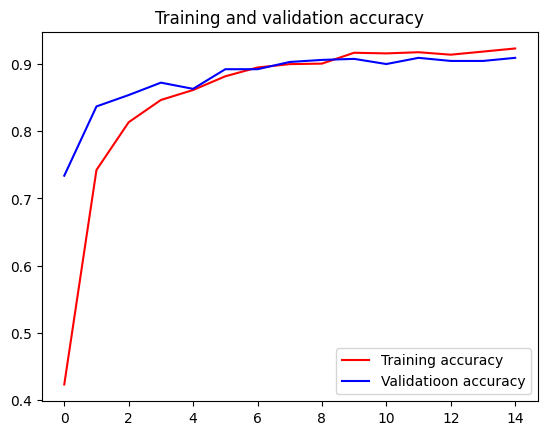

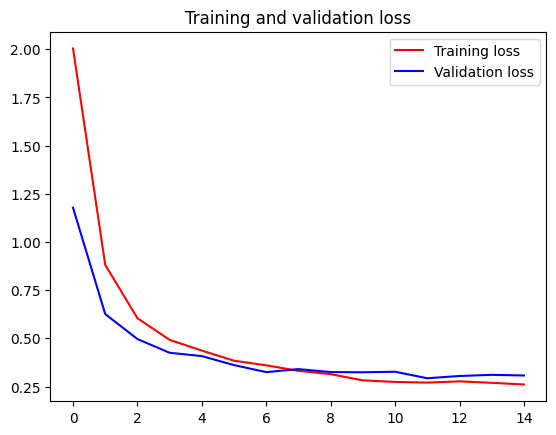

<Figure size 640x480 with 0 Axes>

In [16]:
# Plotting visualization
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

# Plot Training & Validation Accuracy
plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validatioon accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

# Plot Training & Validation Loss
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [17]:
# Load model terbaik yang disimpan checkpoint
best_model = tf.keras.models.load_model('best_model.keras')

# Evaluasi menggunakan data Test
test_loss, test_acc = best_model.evaluate(test_images)
print(f"Test Accuracy: {test_acc*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

33/33 ━━━━━━━━━━━━━━━━━━━━ 32s 713ms/step - accuracy: 0.9074 - loss: 0.2839
Test Accuracy: 90.74%
Test Loss: 0.2839


In [18]:
y = np.concatenate([next(test_images)[1] for i in range(len(test_images))])
true_labels = np.argmax(y, axis=-1)

# Prediksi model
prediction = best_model.predict(test_images, verbose=2)
prediction = np.argmax(prediction, axis=-1)

33/33 - 26s - 785ms/step


Normalized confusion matrix


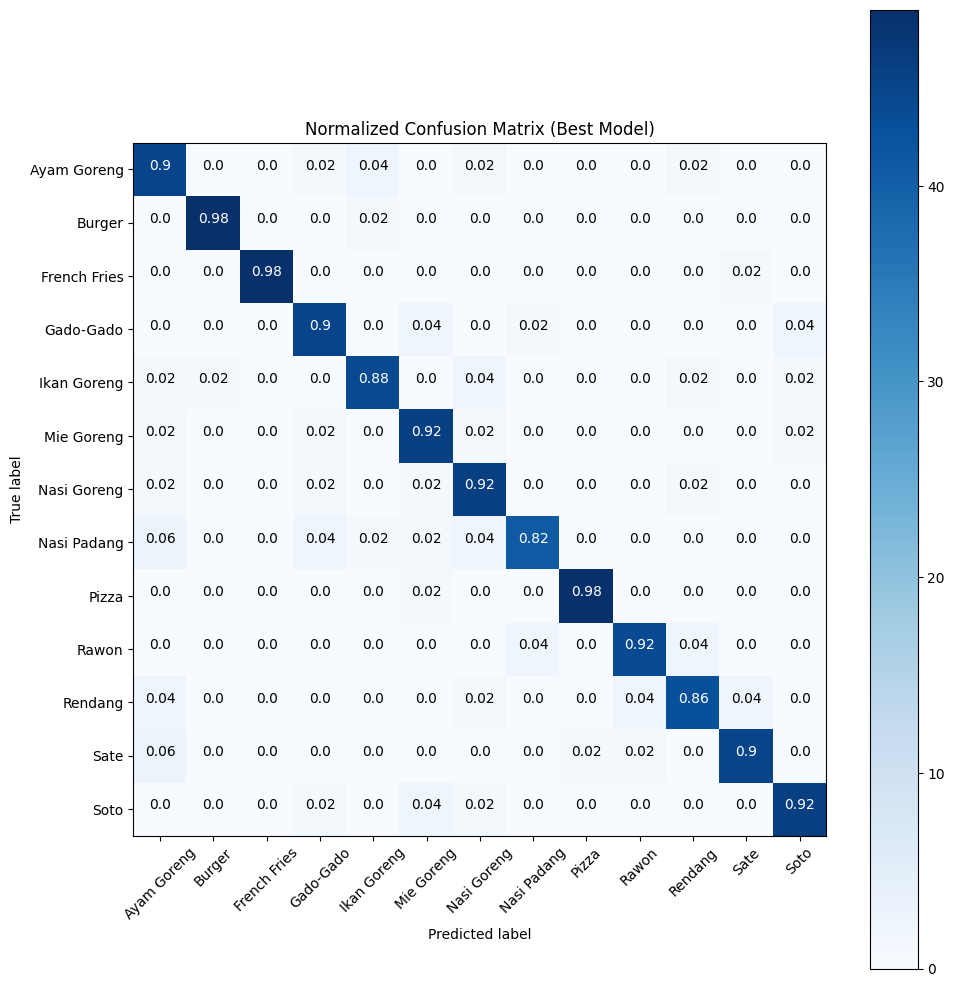


BEST MODEL PERFORMANCE METRICS
Accuracy   : 0.914
Precision  : 0.916 (Macro)
Recall     : 0.914 (Macro)
F1-Score   : 0.914 (Macro)

Detailed Report:
              precision    recall  f1-score   support

 Ayam Goreng       0.80      0.90      0.85        50
      Burger       0.98      0.98      0.98        50
French Fries       1.00      0.98      0.99        50
   Gado-Gado       0.88      0.90      0.89        50
 Ikan Goreng       0.92      0.88      0.90        50
  Mie Goreng       0.87      0.92      0.89        50
 Nasi Goreng       0.85      0.92      0.88        50
 Nasi Padang       0.93      0.82      0.87        50
       Pizza       0.98      0.98      0.98        50
       Rawon       0.94      0.92      0.93        48
     Rendang       0.90      0.86      0.88        50
        Sate       0.94      0.90      0.92        50
        Soto       0.92      0.92      0.92        50

    accuracy                           0.91       648
   macro avg       0.92      0.91     

In [19]:
import numpy as np
import itertools
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

# Load Best Model
best_model = tf.keras.models.load_model('best_model.keras')

test_images.reset()
y_true = []
y_pred = []

# Melakukan prediksi untuk semua batch di test_set
for i in range(len(test_images)):
    images, labels = next(test_images)
    preds = best_model.predict(images, verbose=0)

    y_true.extend(np.argmax(labels, axis=-1))
    y_pred.extend(np.argmax(preds, axis=-1))

true_labels = np.array(y_true)
prediction = np.array(y_pred)

# Fungsi Plot Confusion Matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = np.around(cm, decimals=2)
        cm[np.isnan(cm)] = 0.0
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Eksekusi Visualisasi
target_names = list(train_images.class_indices.keys())
cm = confusion_matrix(true_labels, prediction)

plt.figure(figsize=(10, 10))
plot_confusion_matrix(cm=cm, classes=target_names, normalize=True, title="Normalized Confusion Matrix (Best Model)")
plt.show()

# Print Metrics Detail
print("\n" + "="*30)
print("BEST MODEL PERFORMANCE METRICS")
print("="*30)
print(f"Accuracy   : {accuracy_score(true_labels, prediction):.3f}")
print(f"Precision  : {precision_score(true_labels, prediction, average='macro'):.3f} (Macro)")
print(f"Recall     : {recall_score(true_labels, prediction, average='macro'):.3f} (Macro)")
print(f"F1-Score   : {f1_score(true_labels, prediction, average='macro'):.3f} (Macro)")
print("="*30)

# Menampilkan classification report mendetail
print("\nDetailed Report:")
print(classification_report(true_labels, prediction, target_names=target_names))

# Prediction

In [20]:
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input

def predict_all_classes(testing_dir, model, batch_size=20):
    # Ambil nama kelas dari folder dalam test_dir
    class_names = sorted(os.listdir(testing_dir))

    accuracies = []
    class_labels = []

    # Loop over each class in the test directory
    for class_name in class_names:
        class_dir = os.path.join(testing_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        total_images = len(os.listdir(class_dir))
        correct_predictions = 0

        # Predict each image in the class directory
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)

            # Preprocess the image
            img_ = load_img(img_path, target_size=(224, 224))  # Resize to model input size
            img_array = img_to_array(img_)
            img_processed = preprocess_input(np.expand_dims(img_array, axis=0))  # Normalize using EfficientNet

            # Prediction
            prediction = model.predict(img_processed, verbose=0)
            index = np.argmax(prediction)  # Get the index of the highest prediction score
            predicted_label = class_names[index]  # Get predicted class label

            if predicted_label == class_name:  # Compare with true class
                correct_predictions += 1

        # Calculate accuracy for each class
        acc = correct_predictions / total_images
        accuracies.append(acc)
        class_labels.append(class_name)
        print(f"Class: {class_name}, Accuracy: {acc:.2f} ({correct_predictions}/{total_images})")

    # Plot accuracy per class
    plt.figure(figsize=(10, 6))
    bars = plt.barh(class_labels, accuracies, color='skyblue')
    plt.xlabel('Accuracy')
    plt.ylabel('Class')
    plt.title('Accuracy per Class')
    plt.xlim(0, 1)  # Set x-axis limit from 0 to 1 for accuracy

    # Annotate the bars with the accuracy value
    for bar, acc in zip(bars, accuracies):
        plt.text(bar.get_width() + 0.02, bar.get_y() + bar.get_height() / 2, f"{acc:.2f}",
                 va='center', ha='left', fontsize=10)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

Class: Ayam Goreng, Accuracy: 0.94 (47/50)
Class: Burger, Accuracy: 0.98 (49/50)
Class: French Fries, Accuracy: 1.00 (50/50)
Class: Gado-Gado, Accuracy: 0.86 (43/50)
Class: Ikan Goreng, Accuracy: 0.92 (46/50)
Class: Mie Goreng, Accuracy: 0.92 (46/50)
Class: Nasi Goreng, Accuracy: 0.92 (46/50)
Class: Nasi Padang, Accuracy: 0.80 (40/50)
Class: Pizza, Accuracy: 0.98 (49/50)
Class: Rawon, Accuracy: 0.90 (45/50)
Class: Rendang, Accuracy: 0.88 (44/50)
Class: Sate, Accuracy: 0.90 (45/50)
Class: Soto, Accuracy: 0.98 (49/50)


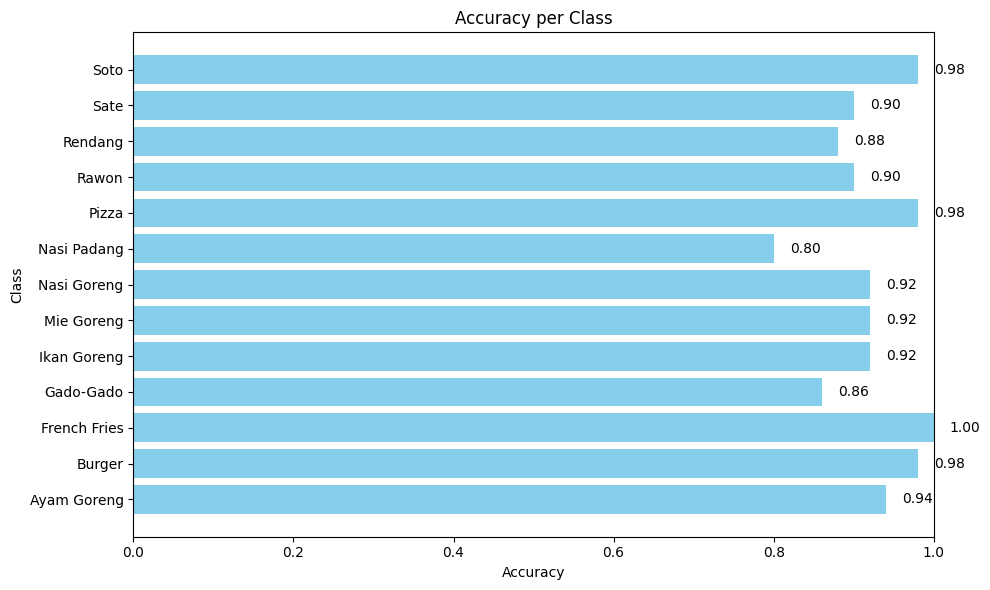

In [21]:
predict_all_classes(testing_dir=test_dir, model=best_model, batch_size=20)

Saving photo.jpg to photo.jpg


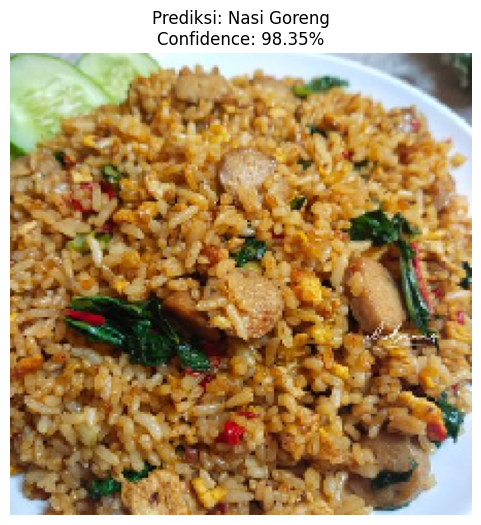

      STRUK KANTIN DIGITAL      
Menu   : Nasi Goreng
Harga  : Rp13,000
------------------------------
TOTAL  : Rp13,000
Terima kasih, selamat makan! 🍛



In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

# Ambil label dari generator (pastikan sudah dijalankan sebelumnya)
class_names = sorted(list(train_images.class_indices.keys()))

# Fungsi Upload dan Prediksi
uploaded = files.upload()

for fn in uploaded.keys():
    # Load dan Preprocess Gambar
    path = fn
    img = image.load_img(path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Gunakan preprocess_input EfficientNet (sesuai fungsi evaluasi kamu sebelumnya)
    from tensorflow.keras.applications.efficientnet import preprocess_input
    img_processed = preprocess_input(np.expand_dims(img_array, axis=0))
    preds = best_model.predict(img_processed, verbose=0)
    score = np.max(preds[0])
    class_idx = np.argmax(preds[0])
    predicted_label = class_names[class_idx]

    # Ambil Harga
    harga = PRICE_MAP.get(predicted_label, 0)

    # Visualisasi Hasil
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Prediksi: {predicted_label}\nConfidence: {score*100:.2f}%")
    plt.axis('off')
    plt.show()

    print("="*30)
    print("      STRUK KANTIN DIGITAL      ")
    print("="*30)
    print(f"Menu   : {predicted_label}")
    print(f"Harga  : Rp{harga:,}")
    print("-" * 30)
    print(f"TOTAL  : Rp{harga:,}")
    print("="*30)
    print("Terima kasih, selamat makan! 🍛\n")

Saving ayam-goreng-final.jpg to ayam-goreng-final.jpg


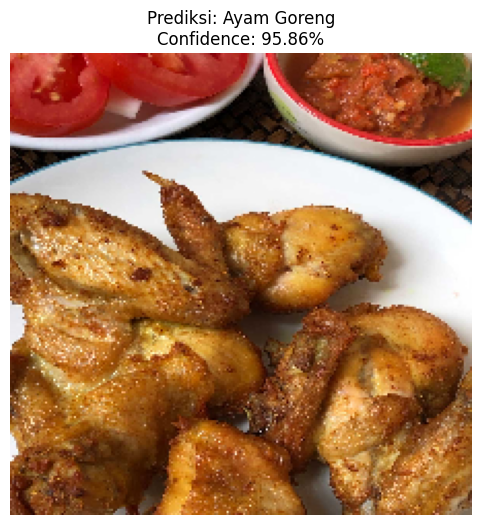

      STRUK KANTIN DIGITAL      
Menu   : Ayam Goreng
Harga  : Rp10,000
------------------------------
TOTAL  : Rp10,000
Terima kasih, selamat makan! 🍛



In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

# Ambil label dari generator (pastikan sudah dijalankan sebelumnya)
class_names = sorted(list(train_images.class_indices.keys()))

# Fungsi Upload dan Prediksi
uploaded = files.upload()

for fn in uploaded.keys():
    # Load dan Preprocess Gambar
    path = fn
    img = image.load_img(path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Gunakan preprocess_input EfficientNet (sesuai fungsi evaluasi kamu sebelumnya)
    from tensorflow.keras.applications.efficientnet import preprocess_input
    img_processed = preprocess_input(np.expand_dims(img_array, axis=0))
    preds = best_model.predict(img_processed, verbose=0)
    score = np.max(preds[0])
    class_idx = np.argmax(preds[0])
    predicted_label = class_names[class_idx]

    # Ambil Harga
    harga = PRICE_MAP.get(predicted_label, 0)

    # Visualisasi Hasil
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Prediksi: {predicted_label}\nConfidence: {score*100:.2f}%")
    plt.axis('off')
    plt.show()

    print("="*30)
    print("      STRUK KANTIN DIGITAL      ")
    print("="*30)
    print(f"Menu   : {predicted_label}")
    print(f"Harga  : Rp{harga:,}")
    print("-" * 30)
    print(f"TOTAL  : Rp{harga:,}")
    print("="*30)
    print("Terima kasih, selamat makan! 🍛\n")

Saving photo (1).jpg to photo (1).jpg


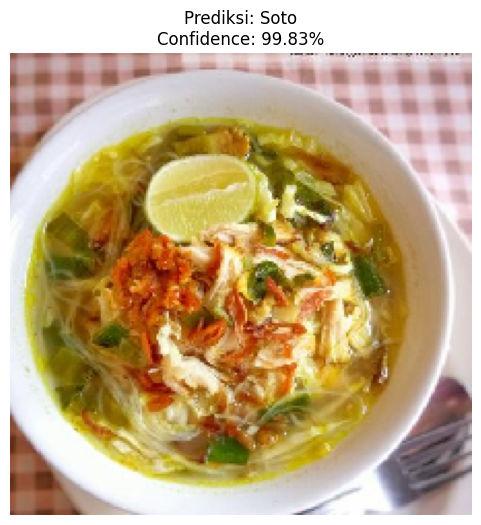

      STRUK KANTIN DIGITAL      
Menu   : Soto
Harga  : Rp12,000
------------------------------
TOTAL  : Rp12,000
Terima kasih, selamat makan! 🍛



In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

# Ambil label dari generator (pastikan sudah dijalankan sebelumnya)
class_names = sorted(list(train_images.class_indices.keys()))

# Fungsi Upload dan Prediksi
uploaded = files.upload()

for fn in uploaded.keys():
    # Load dan Preprocess Gambar
    path = fn
    img = image.load_img(path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Gunakan preprocess_input EfficientNet (sesuai fungsi evaluasi kamu sebelumnya)
    from tensorflow.keras.applications.efficientnet import preprocess_input
    img_processed = preprocess_input(np.expand_dims(img_array, axis=0))
    preds = best_model.predict(img_processed, verbose=0)
    score = np.max(preds[0])
    class_idx = np.argmax(preds[0])
    predicted_label = class_names[class_idx]

    # Ambil Harga
    harga = PRICE_MAP.get(predicted_label, 0)

    # Visualisasi Hasil
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Prediksi: {predicted_label}\nConfidence: {score*100:.2f}%")
    plt.axis('off')
    plt.show()

    print("="*30)
    print("      STRUK KANTIN DIGITAL      ")
    print("="*30)
    print(f"Menu   : {predicted_label}")
    print(f"Harga  : Rp{harga:,}")
    print("-" * 30)
    print(f"TOTAL  : Rp{harga:,}")
    print("="*30)
    print("Terima kasih, selamat makan! 🍛\n")

Saving 63486d6c-fb91-4a8c-a329-4b95a0a4deb3.jpg to 63486d6c-fb91-4a8c-a329-4b95a0a4deb3.jpg


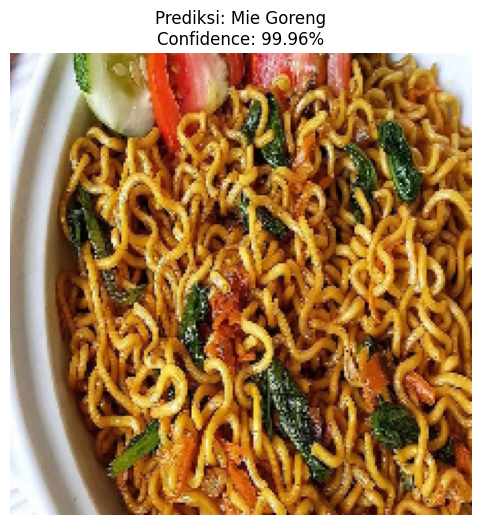

      STRUK KANTIN DIGITAL      
Menu   : Mie Goreng
Harga  : Rp10,000
------------------------------
TOTAL  : Rp10,000
Terima kasih, selamat makan! 🍛



In [61]:
from google.colab import files
from tensorflow.keras.preprocessing import image

# Ambil label dari generator (pastikan sudah dijalankan sebelumnya)
class_names = sorted(list(train_images.class_indices.keys()))

# Fungsi Upload dan Prediksi
uploaded = files.upload()

for fn in uploaded.keys():
    # Load dan Preprocess Gambar
    path = fn
    img = image.load_img(path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Gunakan preprocess_input EfficientNet (sesuai fungsi evaluasi kamu sebelumnya)
    from tensorflow.keras.applications.efficientnet import preprocess_input
    img_processed = preprocess_input(np.expand_dims(img_array, axis=0))
    preds = best_model.predict(img_processed, verbose=0)
    score = np.max(preds[0])
    class_idx = np.argmax(preds[0])
    predicted_label = class_names[class_idx]

    # Ambil Harga
    harga = PRICE_MAP.get(predicted_label, 0)

    # Visualisasi Hasil
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Prediksi: {predicted_label}\nConfidence: {score*100:.2f}%")
    plt.axis('off')
    plt.show()

    print("="*30)
    print("      STRUK KANTIN DIGITAL      ")
    print("="*30)
    print(f"Menu   : {predicted_label}")
    print(f"Harga  : Rp{harga:,}")
    print("-" * 30)
    print(f"TOTAL  : Rp{harga:,}")
    print("="*30)
    print("Terima kasih, selamat makan! 🍛\n")

Saving photo (2).jpg to photo (2).jpg


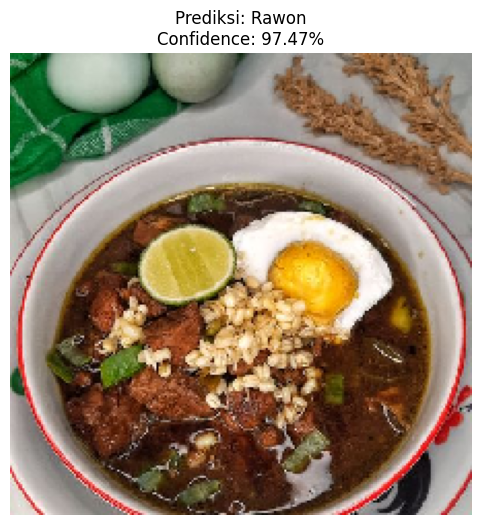

      STRUK KANTIN DIGITAL      
Menu   : Rawon
Harga  : Rp12,000
------------------------------
TOTAL  : Rp12,000
Terima kasih, selamat makan! 🍛



In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

# Ambil label dari generator (pastikan sudah dijalankan sebelumnya)
class_names = sorted(list(train_images.class_indices.keys()))

# Fungsi Upload dan Prediksi
uploaded = files.upload()

for fn in uploaded.keys():
    # Load dan Preprocess Gambar
    path = fn
    img = image.load_img(path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Gunakan preprocess_input EfficientNet (sesuai fungsi evaluasi kamu sebelumnya)
    from tensorflow.keras.applications.efficientnet import preprocess_input
    img_processed = preprocess_input(np.expand_dims(img_array, axis=0))
    preds = best_model.predict(img_processed, verbose=0)
    score = np.max(preds[0])
    class_idx = np.argmax(preds[0])
    predicted_label = class_names[class_idx]

    # Ambil Harga
    harga = PRICE_MAP.get(predicted_label, 0)

    # Visualisasi Hasil
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Prediksi: {predicted_label}\nConfidence: {score*100:.2f}%")
    plt.axis('off')
    plt.show()

    print("="*30)
    print("      STRUK KANTIN DIGITAL      ")
    print("="*30)
    print(f"Menu   : {predicted_label}")
    print(f"Harga  : Rp{harga:,}")
    print("-" * 30)
    print(f"TOTAL  : Rp{harga:,}")
    print("="*30)
    print("Terima kasih, selamat makan! 🍛\n")

# Prediction & Total Price

       STRUK KANTIN DIGITAL        
1. Gado-Gado       : Rp 10,000
2. Nasi Goreng     : Rp 13,000
3. French Fries    : Rp 12,000
4. Mie Goreng      : Rp 10,000
-----------------------------------
TOTAL ITEM   : 4
TOTAL HARGA  : Rp45,000
  Terima kasih, selamat makan! 🍛



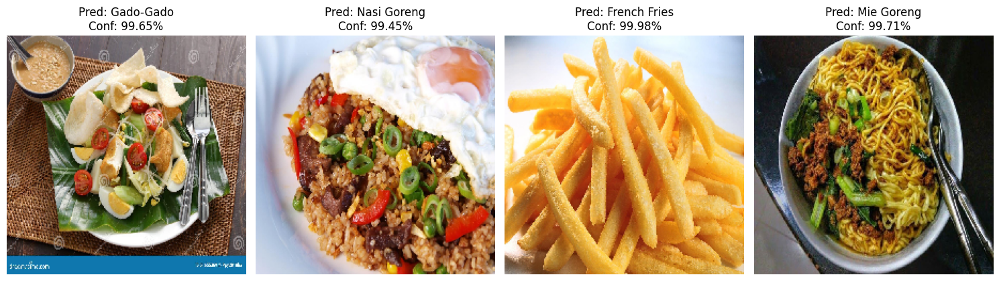

In [26]:
import random
from tensorflow.keras.preprocessing import image

test_dir = 'dataset_gambar/test'
class_names = sorted(os.listdir(test_dir))

# Ambil 4 class secara acak
random_classes = random.sample(class_names, 4)

total_price = 0
plt.figure(figsize=(15, 10))

print("="*35)
print("       STRUK KANTIN DIGITAL        ")
print("="*35)

for i, label in enumerate(random_classes):
  # ambil 1 gambar acak dari folder tersebut
  class_path = os.path.join(test_dir, label)
  random_img_name = random.choice(os.listdir(class_path))
  img_path = os.path.join(class_path, random_img_name)

  # Preprocessing
  img = image.load_img(img_path, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_processed = preprocess_input(np.expand_dims(img_array, axis=0))

  # Prediksi
  preds = best_model.predict(img_processed, verbose=0)
  score = np.max(preds[0])
  class_idx = np.argmax(preds[0])
  predicted_label = class_names[class_idx]

  # Total Harga
  harga = PRICE_MAP.get(predicted_label, 0)
  total_price += harga

  # Tampilkan di Struk (Console)
  print(f"{i+1}. {predicted_label:15} : Rp{harga:>7,}")

  # Visualisasi Hasil
  plt.subplot(1, 4, i + 1)
  plt.imshow(img)
  plt.title(f"Pred: {predicted_label}\nConf: {score*100:.2f}%")
  plt.axis('off')

print("-" * 35)
print(f"TOTAL ITEM   : 4")
print(f"TOTAL HARGA  : Rp{total_price:,}")
print("="*35)
print("  Terima kasih, selamat makan! 🍛\n")

plt.tight_layout()
plt.show()

       STRUK KANTIN DIGITAL        
1. Ikan Goreng     : Rp  8,000
2. French Fries    : Rp 12,000
3. Gado-Gado       : Rp 10,000
4. Rawon           : Rp 12,000
-----------------------------------
TOTAL ITEM   : 4
TOTAL HARGA  : Rp42,000
  Terima kasih, selamat makan! 🍛



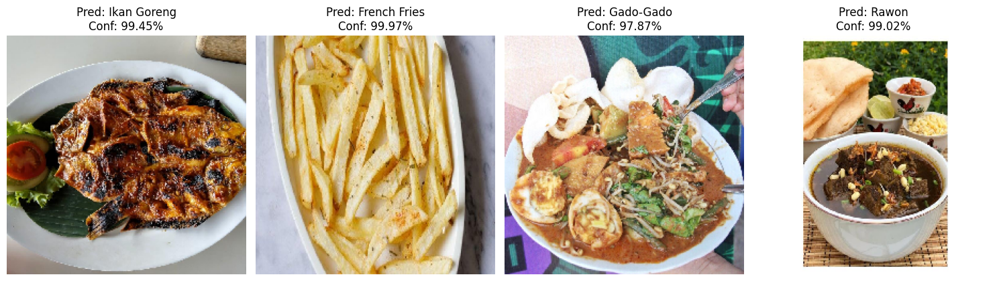

In [37]:
import random
from tensorflow.keras.preprocessing import image

test_dir = 'dataset_gambar/test'
class_names = sorted(os.listdir(test_dir))

# Ambil 4 class secara acak
random_classes = random.sample(class_names, 4)

total_price = 0
plt.figure(figsize=(15, 10))

print("="*35)
print("       STRUK KANTIN DIGITAL        ")
print("="*35)

for i, label in enumerate(random_classes):
  # ambil 1 gambar acak dari folder tersebut
  class_path = os.path.join(test_dir, label)
  random_img_name = random.choice(os.listdir(class_path))
  img_path = os.path.join(class_path, random_img_name)

  # Preprocessing
  img = image.load_img(img_path, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_processed = preprocess_input(np.expand_dims(img_array, axis=0))

  # Prediksi
  preds = best_model.predict(img_processed, verbose=0)
  score = np.max(preds[0])
  class_idx = np.argmax(preds[0])
  predicted_label = class_names[class_idx]

  # Total Harga
  harga = PRICE_MAP.get(predicted_label, 0)
  total_price += harga

  # Tampilkan di Struk (Console)
  print(f"{i+1}. {predicted_label:15} : Rp{harga:>7,}")

  # Visualisasi Hasil
  plt.subplot(1, 4, i + 1)
  plt.imshow(img)
  plt.title(f"Pred: {predicted_label}\nConf: {score*100:.2f}%")
  plt.axis('off')

print("-" * 35)
print(f"TOTAL ITEM   : 4")
print(f"TOTAL HARGA  : Rp{total_price:,}")
print("="*35)
print("  Terima kasih, selamat makan! 🍛\n")

plt.tight_layout()
plt.show()

       STRUK KANTIN DIGITAL        
1. Sate            : Rp 14,000
2. French Fries    : Rp 12,000
3. Rendang         : Rp 15,000
4. Rawon           : Rp 12,000
-----------------------------------
TOTAL ITEM   : 4
TOTAL HARGA  : Rp53,000
  Terima kasih, selamat makan! 🍛



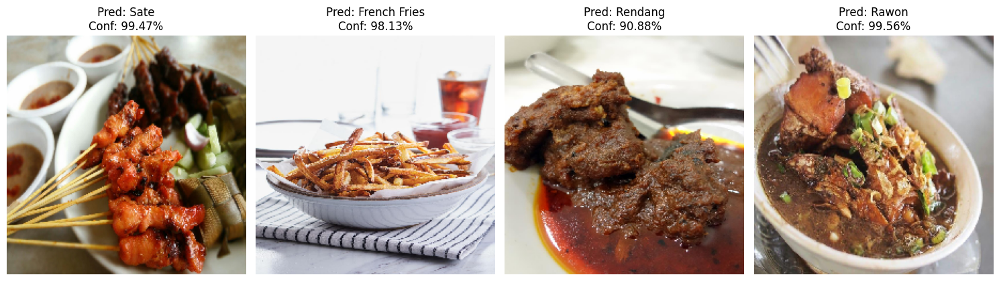

In [51]:
import random
from tensorflow.keras.preprocessing import image

test_dir = 'dataset_gambar/test'
class_names = sorted(os.listdir(test_dir))

# Ambil 4 class secara acak
random_classes = random.sample(class_names, 4)

total_price = 0
plt.figure(figsize=(15, 10))

print("="*35)
print("       STRUK KANTIN DIGITAL        ")
print("="*35)

for i, label in enumerate(random_classes):
  # ambil 1 gambar acak dari folder tersebut
  class_path = os.path.join(test_dir, label)
  random_img_name = random.choice(os.listdir(class_path))
  img_path = os.path.join(class_path, random_img_name)

  # Preprocessing
  img = image.load_img(img_path, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_processed = preprocess_input(np.expand_dims(img_array, axis=0))

  # Prediksi
  preds = best_model.predict(img_processed, verbose=0)
  score = np.max(preds[0])
  class_idx = np.argmax(preds[0])
  predicted_label = class_names[class_idx]

  # Total Harga
  harga = PRICE_MAP.get(predicted_label, 0)
  total_price += harga

  # Tampilkan di Struk (Console)
  print(f"{i+1}. {predicted_label:15} : Rp{harga:>7,}")

  # Visualisasi Hasil
  plt.subplot(1, 4, i + 1)
  plt.imshow(img)
  plt.title(f"Pred: {predicted_label}\nConf: {score*100:.2f}%")
  plt.axis('off')

print("-" * 35)
print(f"TOTAL ITEM   : 4")
print(f"TOTAL HARGA  : Rp{total_price:,}")
print("="*35)
print("  Terima kasih, selamat makan! 🍛\n")

plt.tight_layout()
plt.show()

       STRUK KANTIN DIGITAL        
1. Soto            : Rp 12,000
2. Ikan Goreng     : Rp  8,000
3. Gado-Gado       : Rp 10,000
4. Burger          : Rp 15,000
-----------------------------------
TOTAL ITEM   : 4
TOTAL HARGA  : Rp45,000
  Terima kasih, selamat makan! 🍛



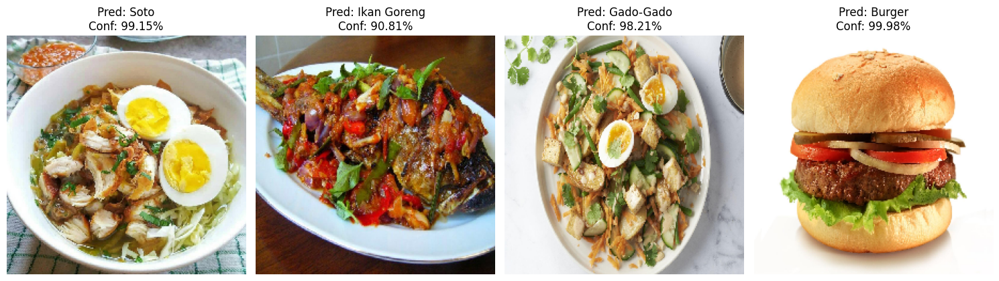

In [59]:
import random
from tensorflow.keras.preprocessing import image

test_dir = 'dataset_gambar/test'
class_names = sorted(os.listdir(test_dir))

# Ambil 4 class secara acak
random_classes = random.sample(class_names, 4)

total_price = 0
plt.figure(figsize=(15, 10))

print("="*35)
print("       STRUK KANTIN DIGITAL        ")
print("="*35)

for i, label in enumerate(random_classes):
  # ambil 1 gambar acak dari folder tersebut
  class_path = os.path.join(test_dir, label)
  random_img_name = random.choice(os.listdir(class_path))
  img_path = os.path.join(class_path, random_img_name)

  # Preprocessing
  img = image.load_img(img_path, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_processed = preprocess_input(np.expand_dims(img_array, axis=0))

  # Prediksi
  preds = best_model.predict(img_processed, verbose=0)
  score = np.max(preds[0])
  class_idx = np.argmax(preds[0])
  predicted_label = class_names[class_idx]

  # Total Harga
  harga = PRICE_MAP.get(predicted_label, 0)
  total_price += harga

  # Tampilkan di Struk (Console)
  print(f"{i+1}. {predicted_label:15} : Rp{harga:>7,}")

  # Visualisasi Hasil
  plt.subplot(1, 4, i + 1)
  plt.imshow(img)
  plt.title(f"Pred: {predicted_label}\nConf: {score*100:.2f}%")
  plt.axis('off')

print("-" * 35)
print(f"TOTAL ITEM   : 4")
print(f"TOTAL HARGA  : Rp{total_price:,}")
print("="*35)
print("  Terima kasih, selamat makan! 🍛\n")

plt.tight_layout()
plt.show()

       STRUK KANTIN DIGITAL        
1. Nasi Padang     : Rp 15,000
2. Soto            : Rp 12,000
3. Pizza           : Rp 20,000
4. Mie Goreng      : Rp 10,000
-----------------------------------
TOTAL ITEM   : 4
TOTAL HARGA  : Rp57,000
  Terima kasih, selamat makan! 🍛



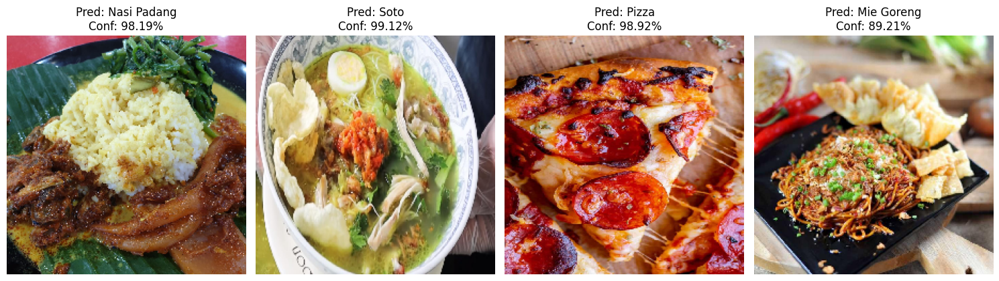

In [53]:
import random
from tensorflow.keras.preprocessing import image

test_dir = 'dataset_gambar/test'
class_names = sorted(os.listdir(test_dir))

# Ambil 4 class secara acak
random_classes = random.sample(class_names, 4)

total_price = 0
plt.figure(figsize=(15, 10))

print("="*35)
print("       STRUK KANTIN DIGITAL        ")
print("="*35)

for i, label in enumerate(random_classes):
  # ambil 1 gambar acak dari folder tersebut
  class_path = os.path.join(test_dir, label)
  random_img_name = random.choice(os.listdir(class_path))
  img_path = os.path.join(class_path, random_img_name)

  # Preprocessing
  img = image.load_img(img_path, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_processed = preprocess_input(np.expand_dims(img_array, axis=0))

  # Prediksi
  preds = best_model.predict(img_processed, verbose=0)
  score = np.max(preds[0])
  class_idx = np.argmax(preds[0])
  predicted_label = class_names[class_idx]

  # Total Harga
  harga = PRICE_MAP.get(predicted_label, 0)
  total_price += harga

  # Tampilkan di Struk (Console)
  print(f"{i+1}. {predicted_label:15} : Rp{harga:>7,}")

  # Visualisasi Hasil
  plt.subplot(1, 4, i + 1)
  plt.imshow(img)
  plt.title(f"Pred: {predicted_label}\nConf: {score*100:.2f}%")
  plt.axis('off')

print("-" * 35)
print(f"TOTAL ITEM   : 4")
print(f"TOTAL HARGA  : Rp{total_price:,}")
print("="*35)
print("  Terima kasih, selamat makan! 🍛\n")

plt.tight_layout()
plt.show()

       STRUK KANTIN DIGITAL        
1. Rawon           : Rp 12,000
2. Soto            : Rp 12,000
3. Burger          : Rp 15,000
4. Ikan Goreng     : Rp  8,000
-----------------------------------
TOTAL ITEM   : 4
TOTAL HARGA  : Rp47,000
  Terima kasih, selamat makan! 🍛



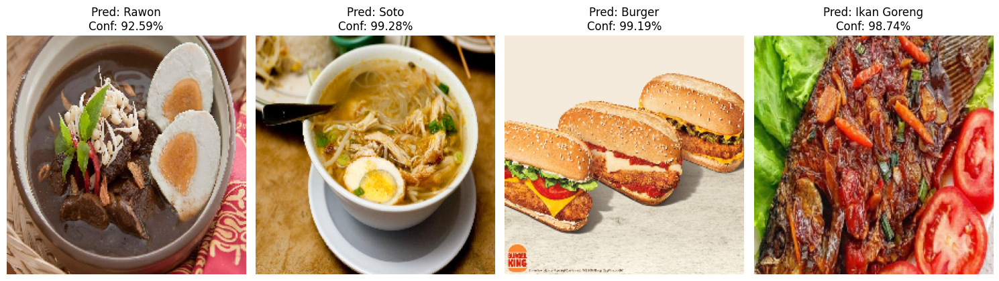

In [49]:
import random
from tensorflow.keras.preprocessing import image

test_dir = 'dataset_gambar/test'
class_names = sorted(os.listdir(test_dir))

# Ambil 4 class secara acak
random_classes = random.sample(class_names, 4)

total_price = 0
plt.figure(figsize=(15, 10))

print("="*35)
print("       STRUK KANTIN DIGITAL        ")
print("="*35)

for i, label in enumerate(random_classes):
  # ambil 1 gambar acak dari folder tersebut
  class_path = os.path.join(test_dir, label)
  random_img_name = random.choice(os.listdir(class_path))
  img_path = os.path.join(class_path, random_img_name)

  # Preprocessing
  img = image.load_img(img_path, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_processed = preprocess_input(np.expand_dims(img_array, axis=0))

  # Prediksi
  preds = best_model.predict(img_processed, verbose=0)
  score = np.max(preds[0])
  class_idx = np.argmax(preds[0])
  predicted_label = class_names[class_idx]

  # Total Harga
  harga = PRICE_MAP.get(predicted_label, 0)
  total_price += harga

  # Tampilkan di Struk (Console)
  print(f"{i+1}. {predicted_label:15} : Rp{harga:>7,}")

  # Visualisasi Hasil
  plt.subplot(1, 4, i + 1)
  plt.imshow(img)
  plt.title(f"Pred: {predicted_label}\nConf: {score*100:.2f}%")
  plt.axis('off')

print("-" * 35)
print(f"TOTAL ITEM   : 4")
print(f"TOTAL HARGA  : Rp{total_price:,}")
print("="*35)
print("  Terima kasih, selamat makan! 🍛\n")

plt.tight_layout()
plt.show()

# Konversi Model

In [27]:
from google.colab import files
files.download('best_model.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
# Simpan ke format SavedModel (Folder)
best_model.export('saved_model_kantin')
print("✅ Model berhasil disimpan dalam format SavedModel di folder 'saved_model_kantin'")

!zip -r saved_model_kantin.zip saved_model_kantin

# Download Saved Model
from google.colab import files
files.download('saved_model_kantin.zip')

Saved artifact at 'saved_model_kantin'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): List[TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer')]
Output Type:
  TensorSpec(shape=(None, 13), dtype=tf.float32, name=None)
Captures:
  138913036925456: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138913036926224: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138913036174352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036173584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036175696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036174928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036175888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036181648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036181840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138913036175120: TensorSpec(shape=(), dtype=tf.resource, n

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
!pip freeze > requirements.txt